In [2]:
!pip install opencv-python --upgrade

Enter K to create VLAD:256
No of Subvectors for ADC:8
Enter Query Index:0
NN of Query Index  0 is the  2 th Image(shown above).


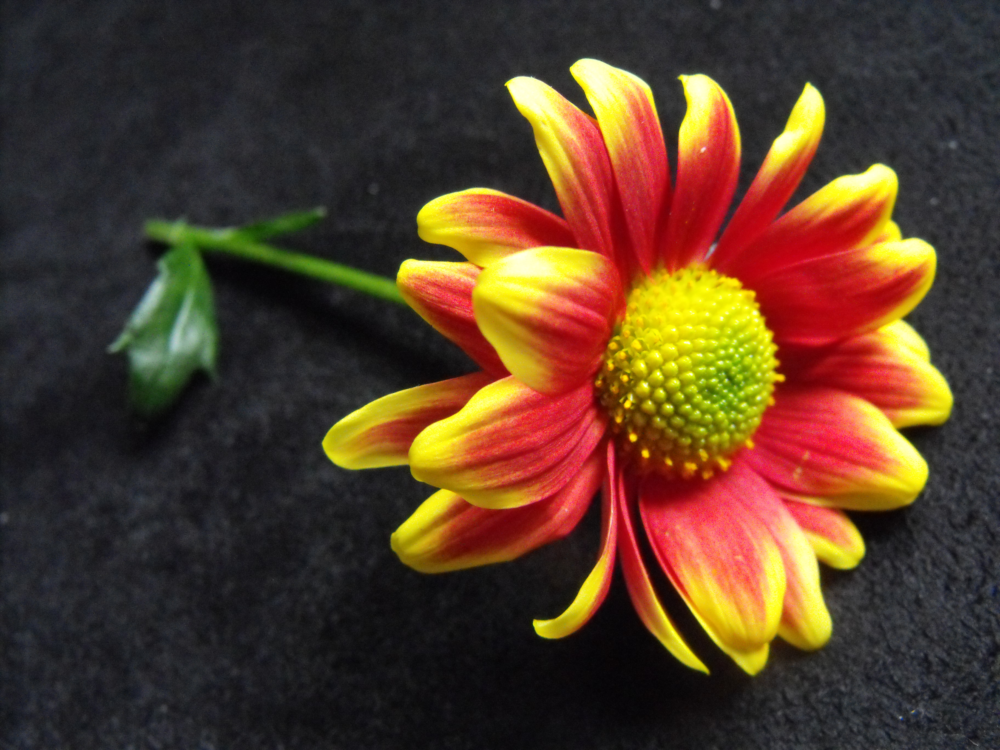

In [5]:
import cv2
import glob
import numpy as np
from sklearn.cluster import KMeans
import sys
from google.colab.patches import cv2_imshow

def get_Ilist(path):
    filenames = [img for img in glob.glob(path)]

    filenames.sort()
    
    images = []
    for img in filenames:
        n= cv2.imread(img)
        images.append(n)

    return images

def get_xlist(Images,sift):
    list=[]
    for img in range(len(Images)):
        kp,x =sift.detectAndCompute(Images[img],None)
        list.append(x)
    return list 

def VLAD(x_list,k):  
    
    v_list=[]
    kmeans = KMeans(n_clusters=k)
    for index in range(len(x_list)):
        kmeans.fit(x_list[index])
        clustroids=kmeans.cluster_centers_
        cluster_points={i: x_list[index][np.where(kmeans.labels_ == i)] for i in range(kmeans.n_clusters)}
        for i, value in cluster_points.items():
            for index in range(len(value[0].shape)):
                value[index]=value[index]-clustroids[i]
        list=[]
        for i, value in cluster_points.items():
            list.append(value.sum(axis=0))
        v=np.array(list)
        v_list.append(v)
    return v_list

def qdb_split(v_list,qi):
    
    q=[]
    q.append(v_list[qi])
    v_list.pop(qi)
    return q, v_list

def quantize_y(db,k,m):
    vy_list=[]
    for y in db:
        [y1,y2,y3,y4,y5,y6,y7,y8]=np.hsplit(y,m)
        vy_list.append(VLAD([y1,y2,y3,y4,y5,y6,y7,y8],k))
        [y1,y2,y3,y4,y5,y6,y7,y8].clear
    return vy_list

def normalize_2d(matrix):
    norm = np.linalg.norm(matrix)
    matrix = matrix/norm 
    return matrix
    
def main():
    k=int(input("Enter K to create VLAD:"))
    m=int(input("No of Subvectors for ADC:"))
    qi=int(input('Enter Query Index:'))
    sift = cv2.SIFT_create()
    Path="/content/*.jpg"
    Images = get_Ilist(Path)
    x_list = get_xlist(Images, sift)
    q, db= qdb_split(x_list,qi)
    vym_list=quantize_y(db,k,m)
    vx_list=VLAD(q,k)
    
    vxm_list=[]
    for vx in vx_list:
        vx=normalize_2d(vx)
        [vx1,vx2,vx3,vx4,vx5,vx6,vx7,vx8]=np.hsplit(vx,m)
        vxm_list.append([vx1,vx2,vx3,vx4,vx5,vx6,vx7,vx8])
    
    for vym in vym_list:
        for vy in vym:
            vy=normalize_2d(vy)

    vxm_list=np.array(vxm_list)
    vym_list=np.array(vym_list)
    diff=[]
    for vxm in vxm_list:
        for vym in vym_list:
            di=[]
            for i in range(m):
                d=[]
                for j in range(k):
                    d.append(np.sqrt(np.sum(np.square(vxm[i][j]-vym[i][j]))))
                di.append(d)
                d.clear
            diff.append(np.sum(di))
            di.clear
    temp=min(diff)
    index=diff.index(temp)
    if qi<index:
        # print(Images[index+1].shape)
        # sys.exit
        for vector in Images[index+1]:
            vector = vector / 255
        print("NN of Query Index ",qi,"is the ",index+1,"th Image(shown above).")
        cv2_imshow(Images[index+1])
    if qi>index:
        for vector in Images[index+1]:
            vector = vector / 255
        print("NN of Query Index ",qi,"is the ", index, "th Image(shown above).")
        cv2_imshow(Images[index])
        


main()